In [1]:
import pandas as pd
import numpy as np
import os
from matplotlib import pyplot as plt
plt.rcParams["figure.figsize"] = (12,12)

In [2]:
# def crop(img, ax0_min, ax0_max, ax1_min, ax1_max):
#     ax0_size = ax0_max - ax0_min
#     ax1_size = ax1_max - ax1_min
#     ax0_start = int(max(0, ax0_min - ax0_size*2))
#     ax1_start = int(max(0, ax1_min - ax1_size*2))
#     cropped = img[ax0_start: ax0_start + ax0_size *
#                   5, ax1_start: ax1_start + ax1_size*5]

In [3]:
filename = '../csv_detection_info/21_0, varierende kvalitet.csv'
filename_clean = '../csv_detection_info_clean/21_0, varierende kvalitet.csv'
saved_cropped_image = '//nmbu.no/LargeFile/Project/CubiAI/preprocess/cropped/21/0, varierende kvalitet'

In [4]:
detection_df = pd.read_csv(filename)

In [5]:
detection_df

,base_path,filename,ax0_min,ax0_max,ax1_min,ax1_max,confidence,year,diagnosis,diagnosis_raw
0,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,1.3.51.0.7.1915214006.35079.48201.34717.13304....,1094,1260,1222,1388,0.999982,21,0,0 varierende kvalitet
1,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,1.3.51.0.7.11622249138.50398.9805.48974.46120....,1111,1272,1256,1416,0.999995,21,0,0 varierende kvalitet
2,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,1.3.51.0.7.790405024.10238.8269.38395.54541.60...,1185,1353,893,1061,0.999998,21,0,0 varierende kvalitet
3,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,1.3.51.0.7.12665072364.29115.64839.42289.32461...,931,1166,1253,1488,0.994355,21,0,0 varierende kvalitet
4,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,1.3.51.0.7.13208145330.19516.3917.46362.52852....,1216,1441,1406,1635,0.991243,21,0,0 varierende kvalitet
...,...,...,...,...,...,...,...,...,...,...
364,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,1.3.51.0.7.14169201877.13703.42571.34948.12328...,1506,1701,849,1044,0.999865,21,0,0 varierende kvalitet
365,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,1.3.51.0.7.333265197.53529.10057.45152.62815.5...,1819,2012,1027,1221,0.999797,21,0,0 varierende kvalitet
366,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,1.2.276.0.95.31933.1.20210129.150239.0.2.17684...,759,913,1074,1228,0.994492,21,0,0 varierende kvalitet
367,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,1.2.276.0.95.31933.1.20210129.150135.0.2.17683...,1106,1252,920,1066,0.999992,21,0,0 varierende kvalitet


### [Optional] Sort by confidence (filter out bad prediction)

In [6]:
# detection_df = detection_df[detection_df.confidence > 0.5]

In [7]:
detection_df[detection_df.confidence < 0.5].index

Int64Index([67, 68, 212, 214, 255, 331, 338, 339], dtype='int64')

Note that there is one case that is not good

### Look at the crop images

Are they reasonable, if not, mark the "weird", "wrong detected" image indice before saving it back to the clean folder

In [8]:
# plot every 9 of them

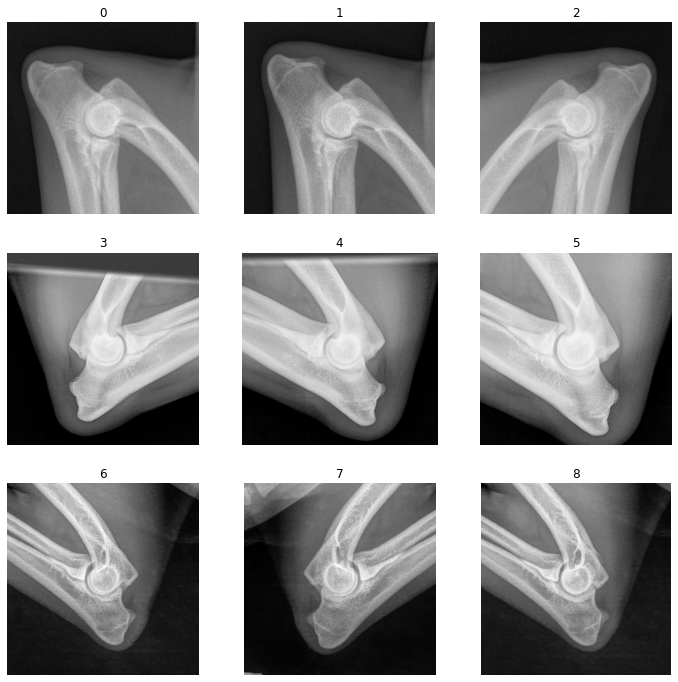

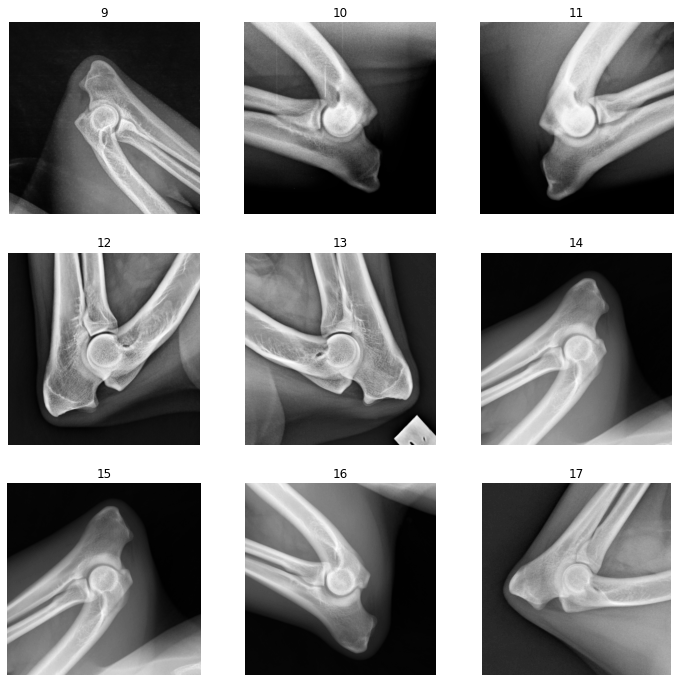

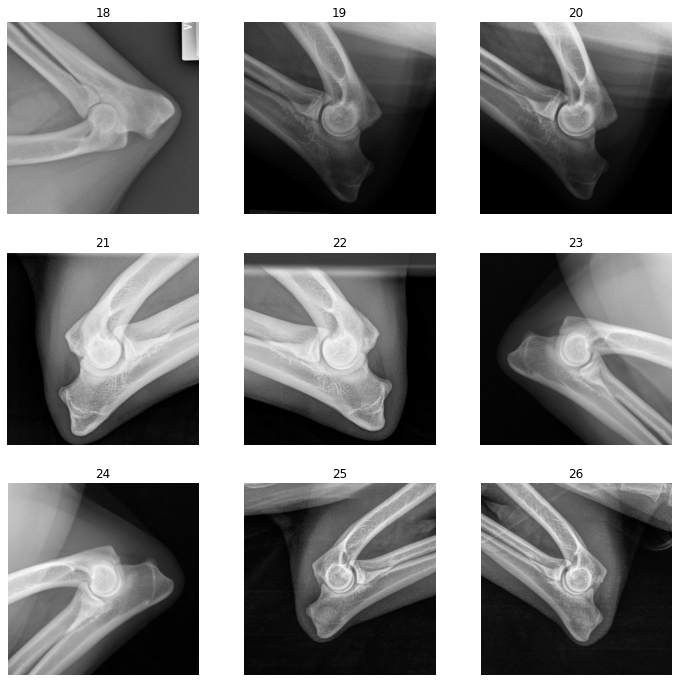

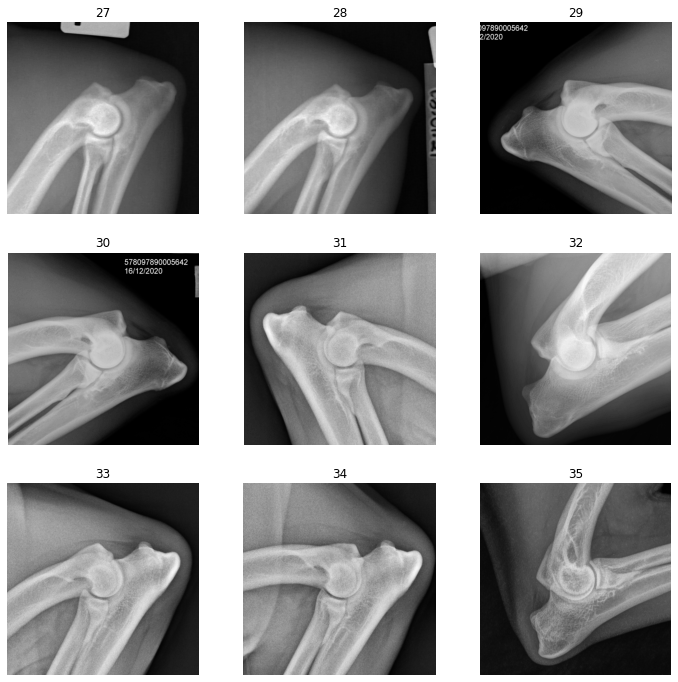

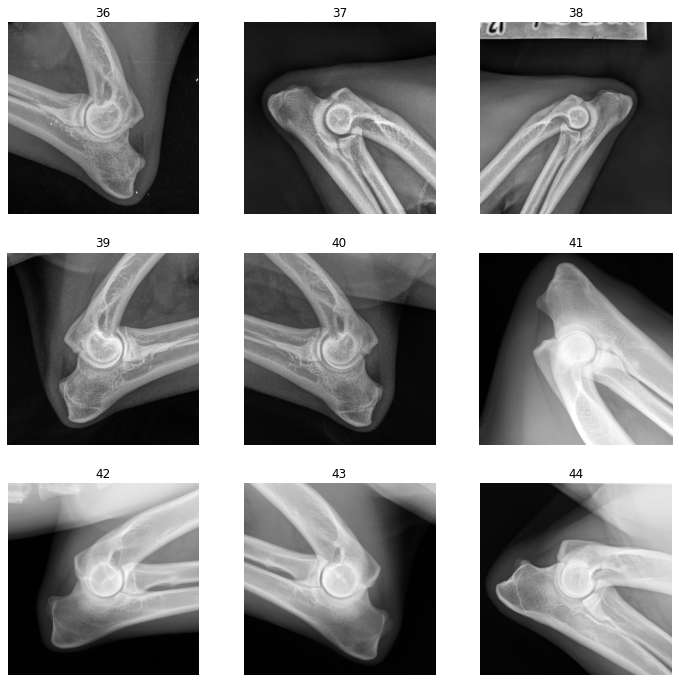

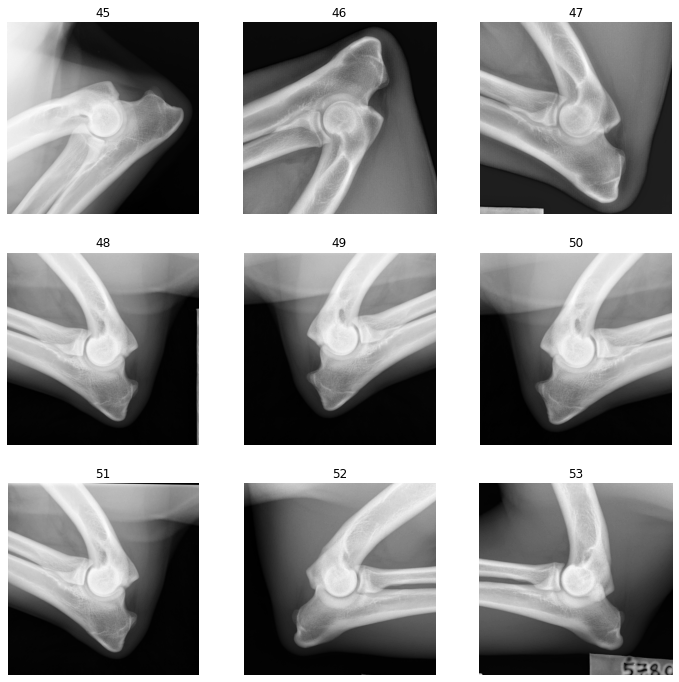

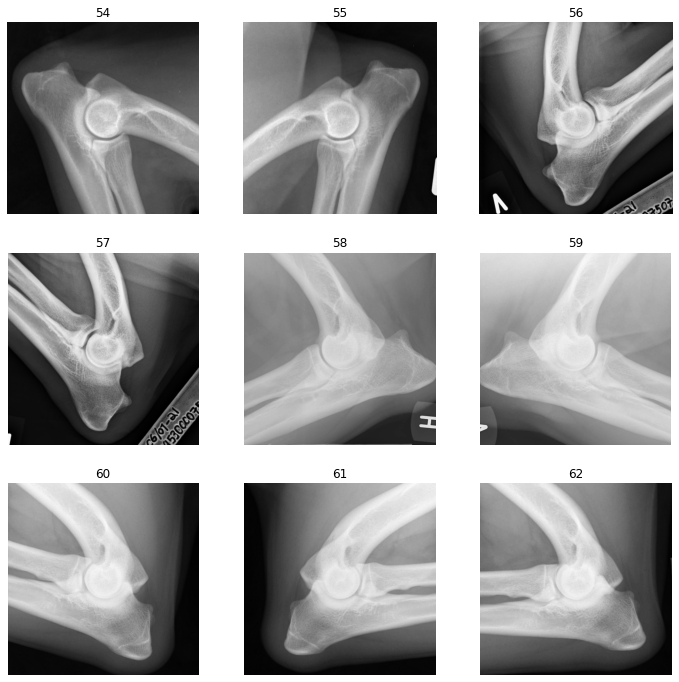

C:\NMBU\TEMP\ipykernel_10120\89006417.py:5: UserWarning: Attempting to set identical left == right == -0.5 results in singular transformations; automatically expanding.
  plt.imshow(img, 'gray')
C:\NMBU\TEMP\ipykernel_10120\89006417.py:5: UserWarning: Attempting to set identical bottom == top == -0.5 results in singular transformations; automatically expanding.
  plt.imshow(img, 'gray')


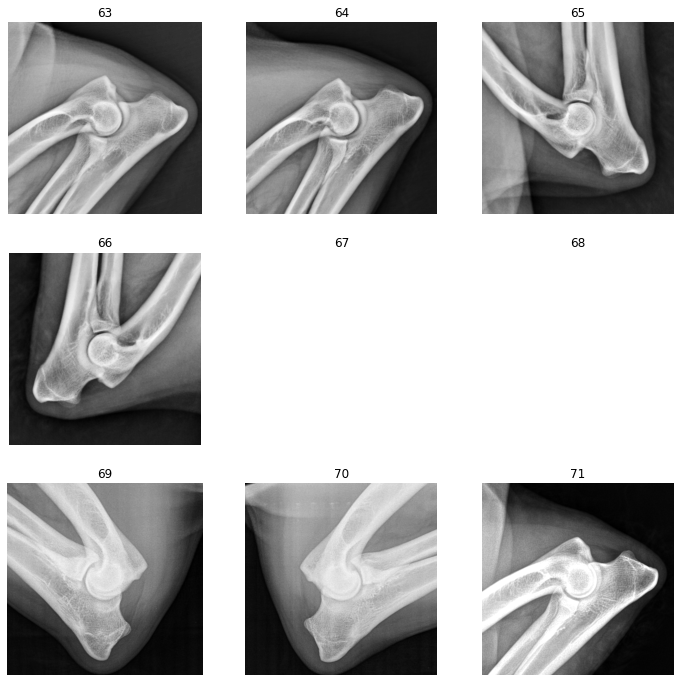

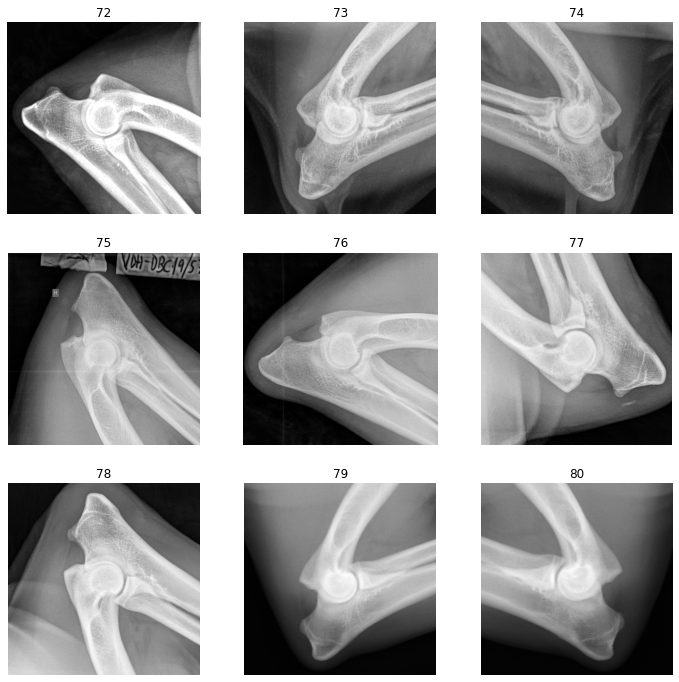

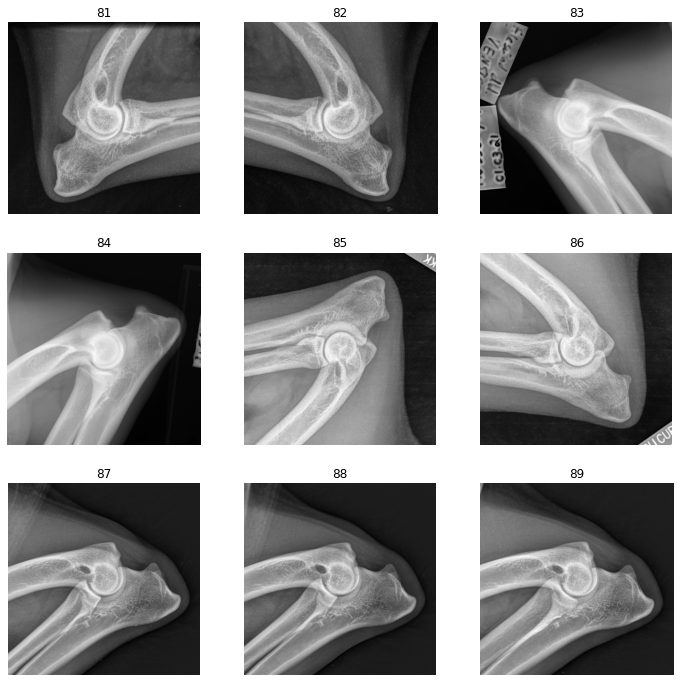

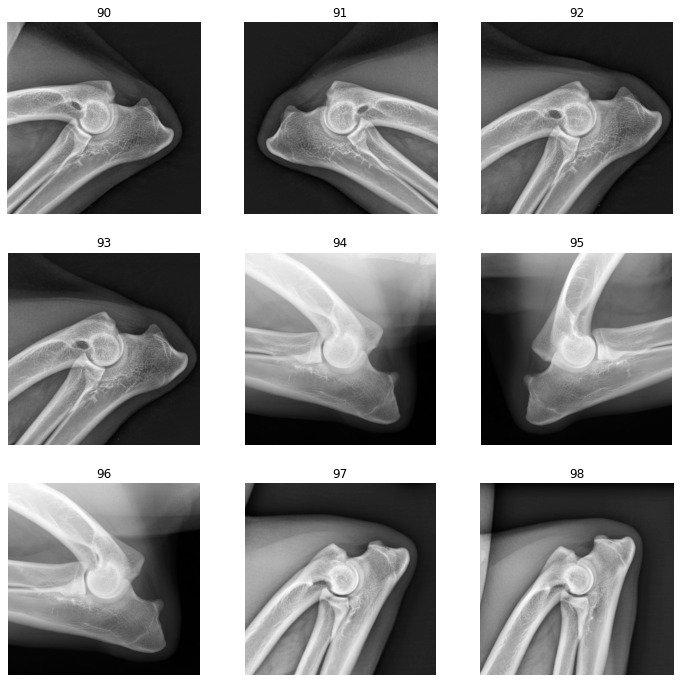

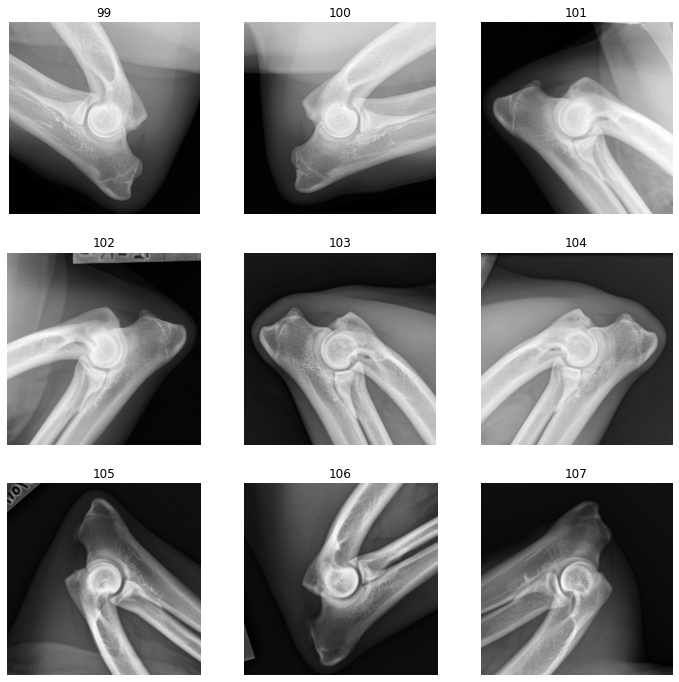

...

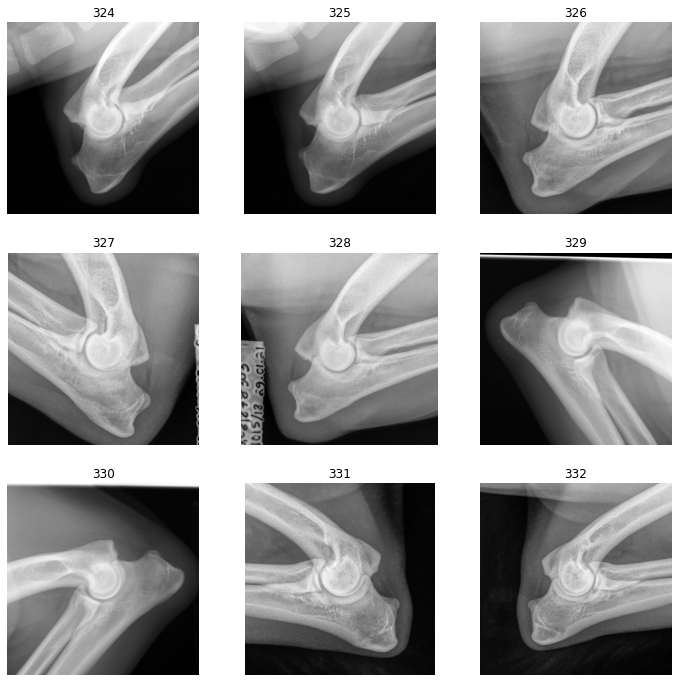

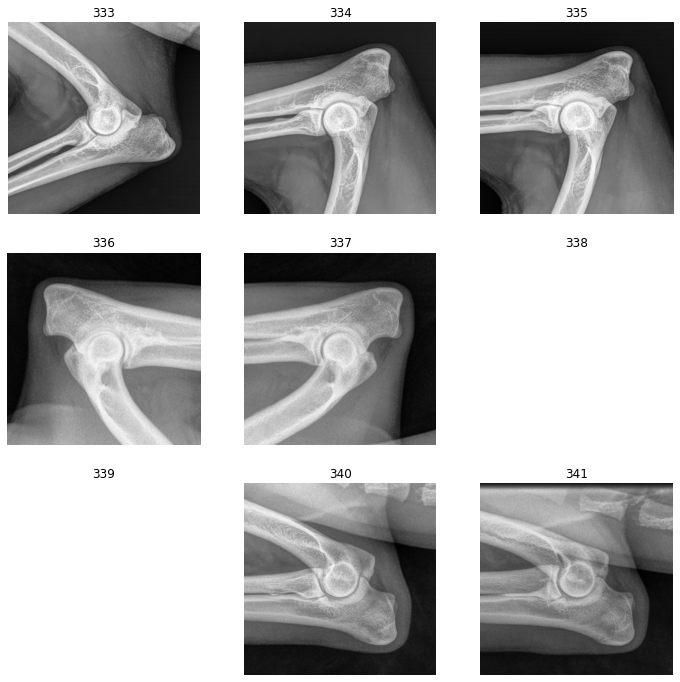

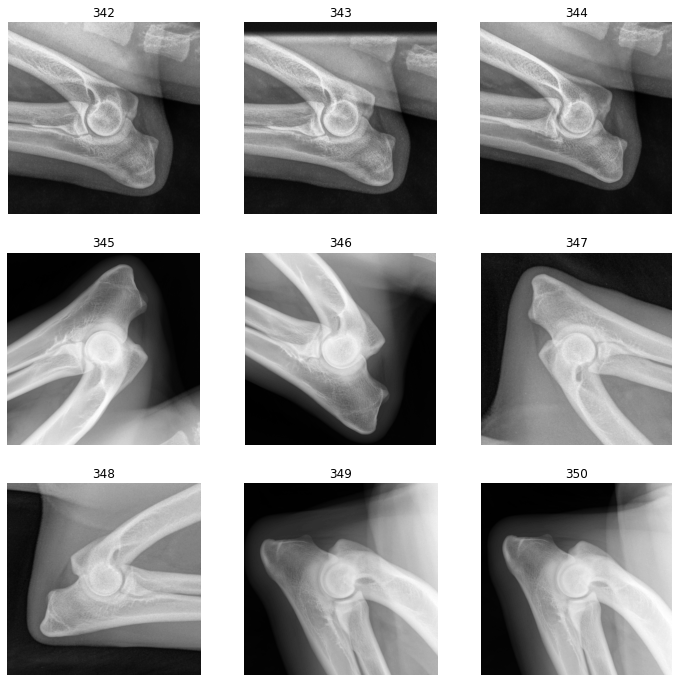

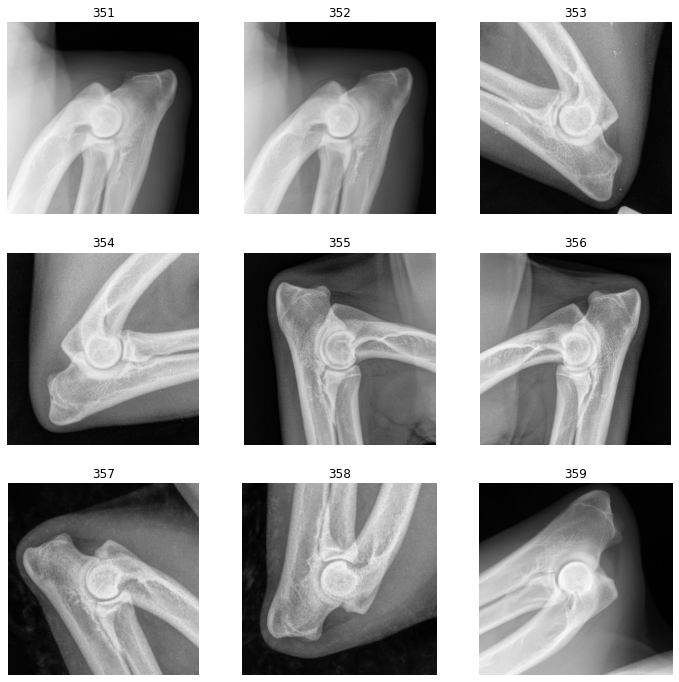

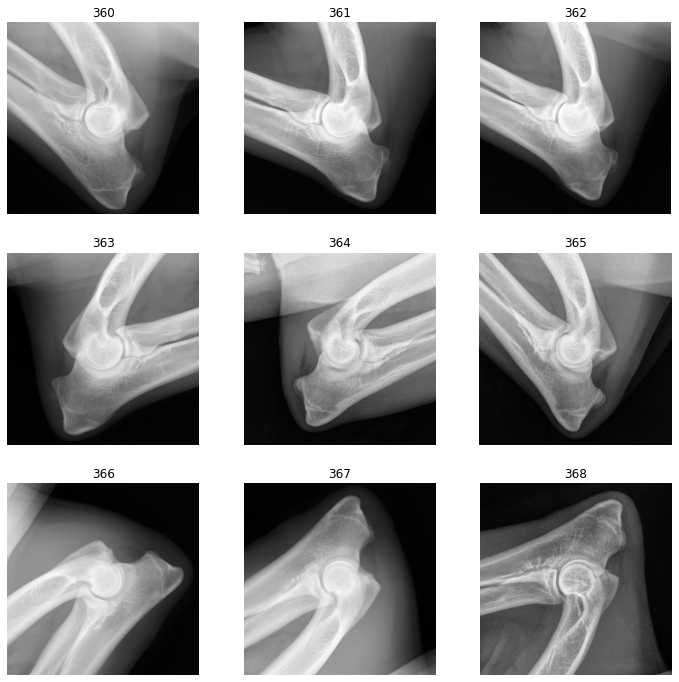

In [9]:
for id, item in detection_df.iterrows():
    fn = item['filename']
    img = np.load(saved_cropped_image + '/' + fn + '.npy')
    plt.subplot(3,3, (id%9) + 1)
    plt.imshow(img, 'gray')
    plt.axis('off')
    plt.title(str(id))
    
    if (id%9) == 8:
        plt.show()
        
plt.show()

## Remove bad detection items

In [10]:
remove_indice = [67, 68, 214, 338, 339]
detection_df[~detection_df.index.isin(remove_indice)]

,base_path,filename,ax0_min,ax0_max,ax1_min,ax1_max,confidence,year,diagnosis,diagnosis_raw
0,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,1.3.51.0.7.1915214006.35079.48201.34717.13304....,1094,1260,1222,1388,0.999982,21,0,0 varierende kvalitet
1,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,1.3.51.0.7.11622249138.50398.9805.48974.46120....,1111,1272,1256,1416,0.999995,21,0,0 varierende kvalitet
2,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,1.3.51.0.7.790405024.10238.8269.38395.54541.60...,1185,1353,893,1061,0.999998,21,0,0 varierende kvalitet
3,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,1.3.51.0.7.12665072364.29115.64839.42289.32461...,931,1166,1253,1488,0.994355,21,0,0 varierende kvalitet
4,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,1.3.51.0.7.13208145330.19516.3917.46362.52852....,1216,1441,1406,1635,0.991243,21,0,0 varierende kvalitet
...,...,...,...,...,...,...,...,...,...,...
364,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,1.3.51.0.7.14169201877.13703.42571.34948.12328...,1506,1701,849,1044,0.999865,21,0,0 varierende kvalitet
365,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,1.3.51.0.7.333265197.53529.10057.45152.62815.5...,1819,2012,1027,1221,0.999797,21,0,0 varierende kvalitet
366,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,1.2.276.0.95.31933.1.20210129.150239.0.2.17684...,759,913,1074,1228,0.994492,21,0,0 varierende kvalitet
367,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,1.2.276.0.95.31933.1.20210129.150135.0.2.17683...,1106,1252,920,1066,0.999992,21,0,0 varierende kvalitet


In [11]:
new_detection_df = detection_df[~detection_df.index.isin(remove_indice)]

In [12]:
new_detection_df.to_csv(filename_clean, index=False)